<a href="https://colab.research.google.com/github/Noah-Clark/Wildlife-Detection/blob/main/Wildlife_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# Define the path to the shared folder within your Google Drive
shared_folder_path = '/content/drive/My Drive/Team5'

# Change the current working directory to the shared folder
os.chdir(shared_folder_path)

# Code below is testing environment

In [ ]:
path = '' #image path

In [ ]:
!pip install transformers torch torchvision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 66.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 63.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 21.1 MB/s eta 0:00:00


In [ ]:
!pip install torch torchvision pillow

In [ ]:
import torch
import torchvision.transforms as T
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from PIL import Image, ImageDraw

In [ ]:
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:02<00:00, 78.1MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
image = Image.open(path).convert("RGB")

# Define a transformation to standardize the image
transform = T.Compose([T.ToTensor()])
image_tensor = transform(image)

In [ ]:
with torch.no_grad():
    predictions = model([image_tensor])

In [ ]:
draw = ImageDraw.Draw(image)
threshold = 0.5  # Adjust the threshold as needed

for score, label, box in zip(predictions[0]["scores"], predictions[0]["labels"], predictions[0]["boxes"]):
    if score >= threshold:
        box = [round(i, 2) for i in box.tolist()]
        draw.rectangle(box, outline="red", width=3)


<ipython-input-11-2965edb3f44a>:5: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image = image.resize((new_width, new_height), Image.ANTIALIAS)


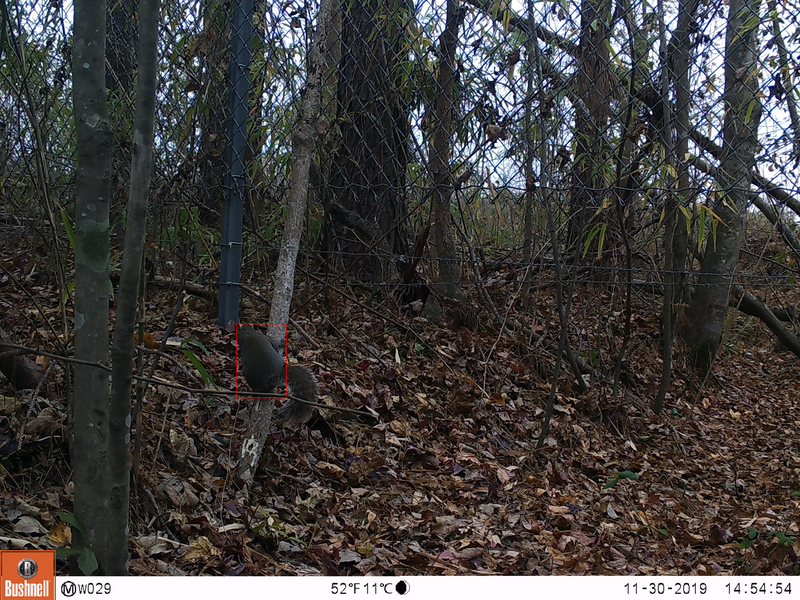

In [ ]:
new_width = 800
new_height = 600

# Resize the image while preserving aspect ratio
image = image.resize((new_width, new_height), Image.ANTIALIAS)
image

The image below fails on the object recognition. This should be an issue further investigate on the exploratory data analysis.

<ipython-input-13-6f2b9009958f>:18: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image = image.resize((new_width, new_height), Image.ANTIALIAS)


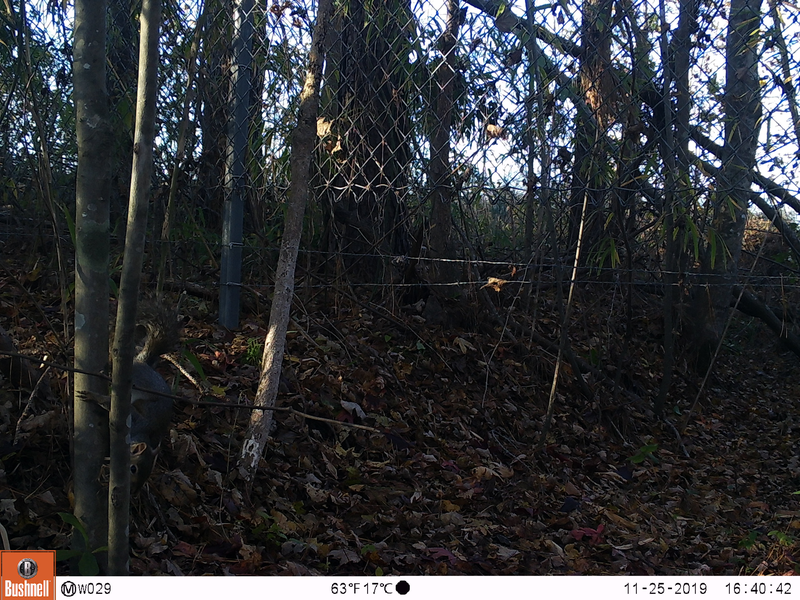

In [ ]:
path = '' # image path
image = Image.open(path).convert("RGB")
transform = T.Compose([T.ToTensor()])
image_tensor = transform(image)
with torch.no_grad():
    predictions = model([image_tensor])
draw = ImageDraw.Draw(image)
threshold = 0.33  # Adjust the threshold as needed

for score, label, box in zip(predictions[0]["scores"], predictions[0]["labels"], predictions[0]["boxes"]):
    if score >= threshold:
        box = [round(i, 2) for i in box.tolist()]
        draw.rectangle(box, outline="red", width=3)
new_width = 800
new_height = 600

# Resize the image while preserving aspect ratio
image = image.resize((new_width, new_height), Image.ANTIALIAS)
image


In [ ]:
predictions

[{'boxes': tensor([], size=(0, 4)),
  'labels': tensor([], dtype=torch.int64),
  'scores': tensor([])}]

<ipython-input-119-b71566766b09>:18: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image = image.resize((new_width, new_height), Image.ANTIALIAS)


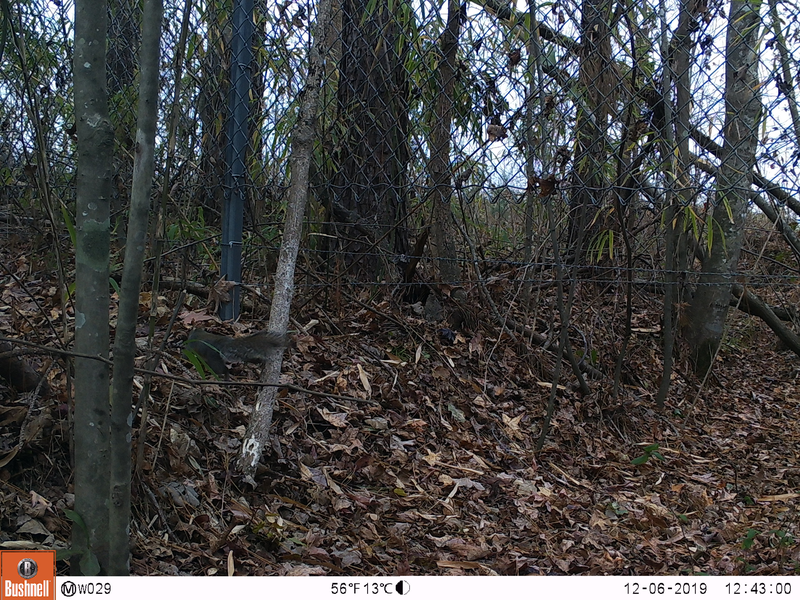

In [ ]:
path = 'Julia_OctNovDec_2019/FE4/W029/Squirrel/FE4_120619_Squirrel1_1.JPG'
image = Image.open(path).convert("RGB")
transform = T.Compose([T.ToTensor()])
image_tensor = transform(image)
with torch.no_grad():
    predictions = model([image_tensor])
draw = ImageDraw.Draw(image)
threshold = 0.5  # Adjust the threshold as needed

for score, label, box in zip(predictions[0]["scores"], predictions[0]["labels"], predictions[0]["boxes"]):
    if score >= threshold:
        box = [round(i, 2) for i in box.tolist()]
        draw.rectangle(box, outline="red", width=3)
new_width = 800
new_height = 600

# Resize the image while preserving aspect ratio
image = image.resize((new_width, new_height), Image.ANTIALIAS)
image


In [ ]:
import os
import cv2
import numpy as np

import torch
import torchvision.transforms as T
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from PIL import Image, ImageDraw

# Load pre-trained object detection model (e.g., TensorFlow, PyTorch)

model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

def process_image(image_path):
    # Load and preprocess image

    image = Image.open(path).convert("RGB")
    transform = T.Compose([T.ToTensor()])
    image_tensor = transform(image)


    with torch.no_grad():
      predictions = model([image_tensor])

    draw = ImageDraw.Draw(image)
    threshold = 0.5  # Adjust the threshold as needed

    for score, label, box in zip(predictions[0]["scores"], predictions[0]["labels"], predictions[0]["boxes"]):
      if score >= threshold:
        box = [round(i, 2) for i in box.tolist()]
        draw.rectangle(box, outline="red", width=3)
    new_width = 800
    new_height = 600

# Resize the image while preserving aspect ratio
    image = image.resize((new_width, new_height), Image.ANTIALIAS)
    return image


# Define the root folder containing your subfolders
root_folder = ''

# Recursively traverse the folder structure
total = 0
images_lst = []

for root, dirs, files in os.walk(root_folder):
    for file in files:
        if file.endswith('.JPG'):
          total += 1
          image_path = os.path.join(root, file)
          print('\n' + image_path)
          images_lst.append(process_image(image_path))




/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_102919_Deer1_1.JPG


<ipython-input-47-ce684a981d91>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image = image.resize((new_width, new_height), Image.ANTIALIAS)



/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_102919_Deer1_2.JPG

/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_102919_Deer1_3.JPG

/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_110119_Deer1_3.JPG

/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_110119_Deer1_1.JPG

/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_110119_Deer1_2.JPG

/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_111219_Deer1_2.JPG

/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_111219_Deer1_1.JPG

/content/drive/My Drive/Team5/Julia_OctNovDec_2019/FE4/W029/Deer/FE4_111219_Deer1_3.JPG


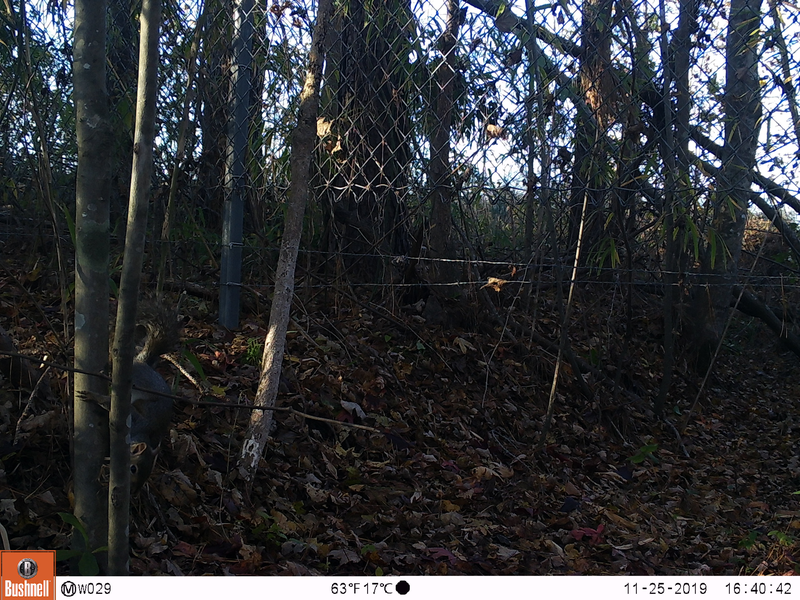

In [ ]:
images_lst[0]

In [ ]:
import pickle

txt_file_path = "" # path to text file

with open(txt_file_path, "wb") as txt_file:
    pickle.dump(images_lst, txt_file)


In [ ]:
# Now we have the FE data

txt_file_path = ""


with open(txt_file_path, "rb") as txt_file:
    loaded_image_list = pickle.load(txt_file)



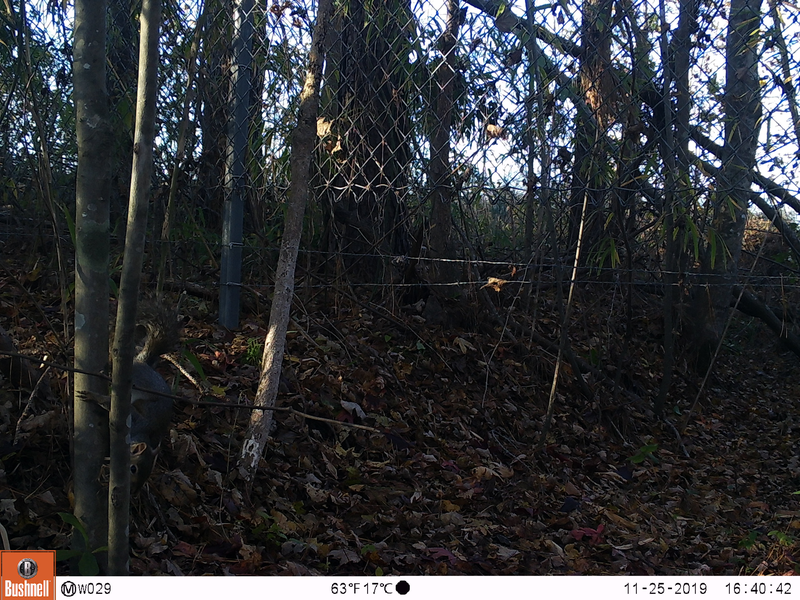

In [ ]:
loaded_image_list[1]


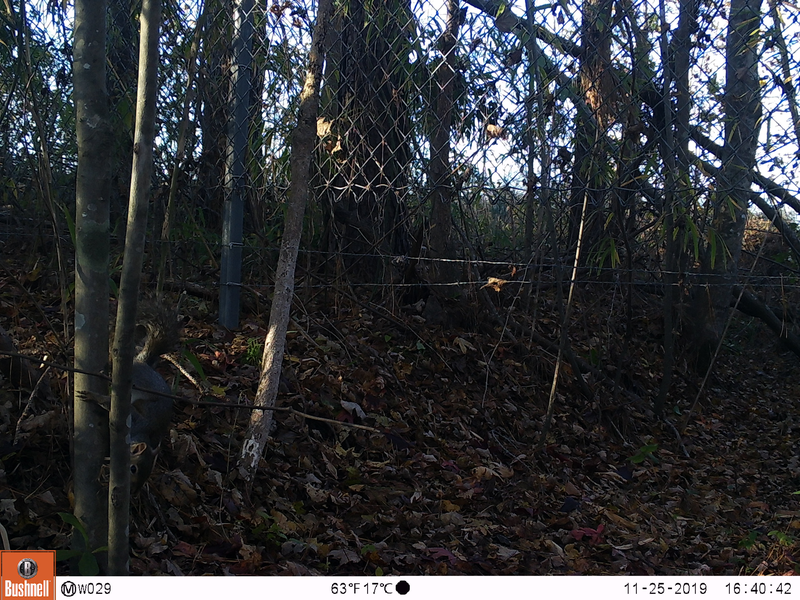

In [ ]:
loaded_image_list[150]

In [ ]:
!pip install IPython

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 10.0 MB/s eta 0:00:00


<ipython-input-17-39fd7256eb3d>:21: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image = image.resize((new_width, new_height), Image.ANTIALIAS)


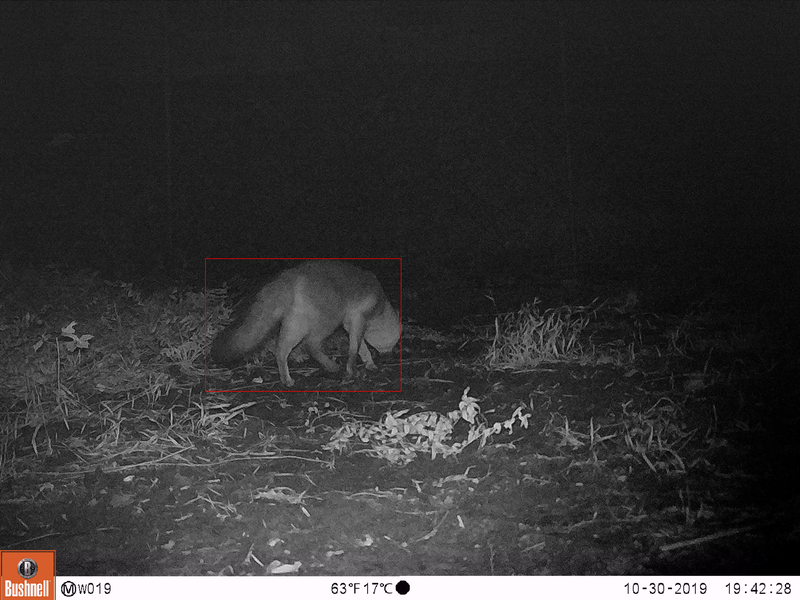

In [ ]:
path = '' #image path
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()
image = Image.open(path).convert("RGB")
transform = T.Compose([T.ToTensor()])
image_tensor = transform(image)
with torch.no_grad():
    predictions = model([image_tensor])
draw = ImageDraw.Draw(image)
threshold = 0.6  # Adjust the threshold as needed


for score, label, box in zip(predictions[0]["scores"], predictions[0]["labels"], predictions[0]["boxes"]):
    if score >= threshold:
        box = [round(i, 2) for i in box.tolist()]
        draw.rectangle(box, outline="red", width=3)
new_width = 800
new_height = 600



# Resize the image while preserving aspect ratio
image = image.resize((new_width, new_height), Image.ANTIALIAS)
image

[153.23, 1296.88, 1459.34, 1967.2]


<ipython-input-7-0921094e8c9b>:22: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image = image.resize((new_width, new_height), Image.ANTIALIAS)


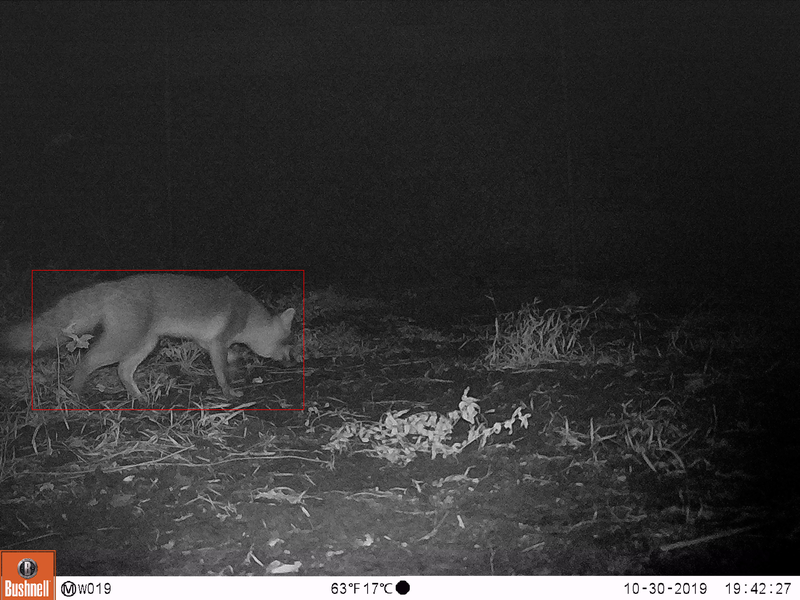

In [ ]:
path = '' # image path
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()
image = Image.open(path).convert("RGB")
transform = T.Compose([T.ToTensor()])
image_tensor = transform(image)
with torch.no_grad():
    predictions = model([image_tensor])
draw = ImageDraw.Draw(image)
threshold = 0.57  # Adjust the threshold as needed

for score, label, box in zip(predictions[0]["scores"], predictions[0]["labels"], predictions[0]["boxes"]):
    if score >= threshold:
      # print(label.item())
      box = [round(i, 2) for i in box.tolist()]
      draw.rectangle(box, outline="red", width=3)
      print(box)
new_width = 800
new_height = 600

# Resize the image while preserving aspect ratio
image = image.resize((new_width, new_height), Image.ANTIALIAS)
image

## Binary classification (fox vs not a fox)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 74.4MB/s]


Not a fox


<ipython-input-8-41bc8626c2b7>:83: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image = image.resize((new_width, new_height), Image.ANTIALIAS)


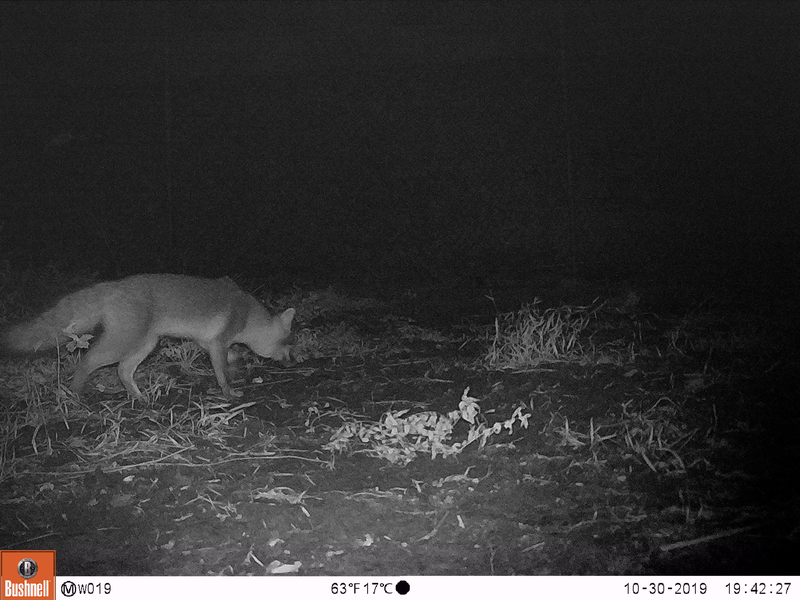

In [ ]:
import torch
import torchvision.transforms as T
from torchvision.models import resnet50
from PIL import Image, ImageDraw, ImageFont
import torch.nn as nn

class CustomClassifier(nn.Module):
    def __init__(self, num_classes):
        super(CustomClassifier, self).__init__()
        self.resnet = resnet50(pretrained=True)
        self.fc = nn.Linear(1000, num_classes)  # Output layer with num_classes classes

    def forward(self, x):
        x = self.resnet(x)
        x = self.fc(x)
        return x

# Load the object detection model (Faster R-CNN)
object_detection_model = fasterrcnn_resnet50_fpn(pretrained=True)
object_detection_model.eval()

num_classes = 2
classification_model = CustomClassifier(num_classes)
classification_model.eval()

# Load and preprocess the image
path = '' # image path
image = Image.open(path).convert("RGB")
# transform = T.Compose([T.Resize(256), T.CenterCrop(224), T.ToTensor(), T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
# image_tensor = transform(image).unsqueeze(0)  # Add batch dimension


transform = T.Compose([T.ToTensor()])
image_tensor = transform(image)



# Object detection
with torch.no_grad():
    predictions = object_detection_model([image_tensor])


font = ImageFont.load_default()


# Perform classification on each detected object
for score, box in zip(predictions[0]["scores"], predictions[0]["boxes"]):
    if score >= threshold:
        box = [round(i, 2) for i in box.tolist()]


        object_image = image.crop(box)


        object_image_tensor = transform(object_image).unsqueeze(0)


        classification_result = classification_model(object_image_tensor)


        predicted_class = torch.argmax(classification_result, dim=1).item()


        class_labels = ["Fox", "Not a fox"]


        label_name = class_labels[predicted_class]




        draw.rectangle(box, outline="red", width=3)


        print(label_name)




new_width = 800
new_height = 600
image = image.resize((new_width, new_height), Image.ANTIALIAS)
image


In [ ]:
print("We predict the object is a", label_name)

We predict the object is a Not a fox


Random code - testing classifcation and object metrics

In [ ]:
predictions

[{'boxes': tensor([[ 153.2319, 1296.8805, 1459.3367, 1967.2046],
          [ 242.0205, 1307.1376, 1377.6173, 1959.6194],
          [ 169.2678, 1297.7681, 1414.9320, 1984.0071],
          [ 160.6136, 1286.4961, 1464.4731, 1972.3390],
          [ 154.4478, 1296.4073, 1492.8335, 1985.9532]]),
  'labels': tensor([18, 21, 20, 16, 17]),
  'scores': tensor([0.5810, 0.5635, 0.4115, 0.1485, 0.1044])}]

In [ ]:
predictions_dict = predictions[0]
predictions_dict

{'boxes': tensor([[ 153.2319, 1296.8805, 1459.3367, 1967.2046],
         [ 242.0205, 1307.1376, 1377.6173, 1959.6194],
         [ 169.2678, 1297.7681, 1414.9320, 1984.0071],
         [ 160.6136, 1286.4961, 1464.4731, 1972.3390],
         [ 154.4478, 1296.4073, 1492.8335, 1985.9532]]),
 'labels': tensor([18, 21, 20, 16, 17]),
 'scores': tensor([0.5810, 0.5635, 0.4115, 0.1485, 0.1044])}

In [ ]:
max_indc = torch.argmax(predictions_dict["scores"])
max_indc

tensor(0)

In [ ]:
box_lst = predictions_dict["boxes"].tolist()
max_lst = box_lst[max_indc][:]
max_lst

[153.2318878173828, 1296.8804931640625, 1459.336669921875, 1967.20458984375]

In [ ]:
box = [ round(i, 2) for i in max_lst]

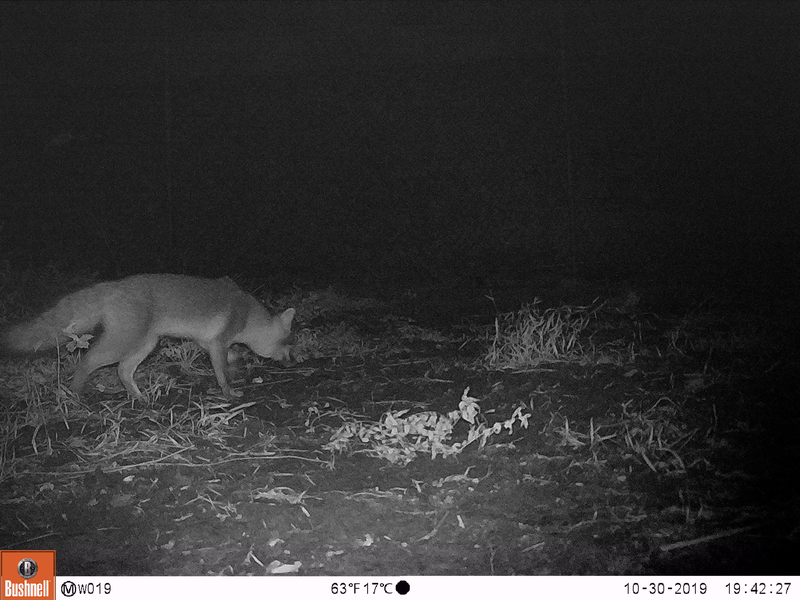

In [ ]:
draw = ImageDraw.Draw(image)

draw.rectangle(box, outline="red", width=3)
image

<ipython-input-16-f08a31f42aaa>:3: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image = image.resize((new_width, new_height), Image.ANTIALIAS)


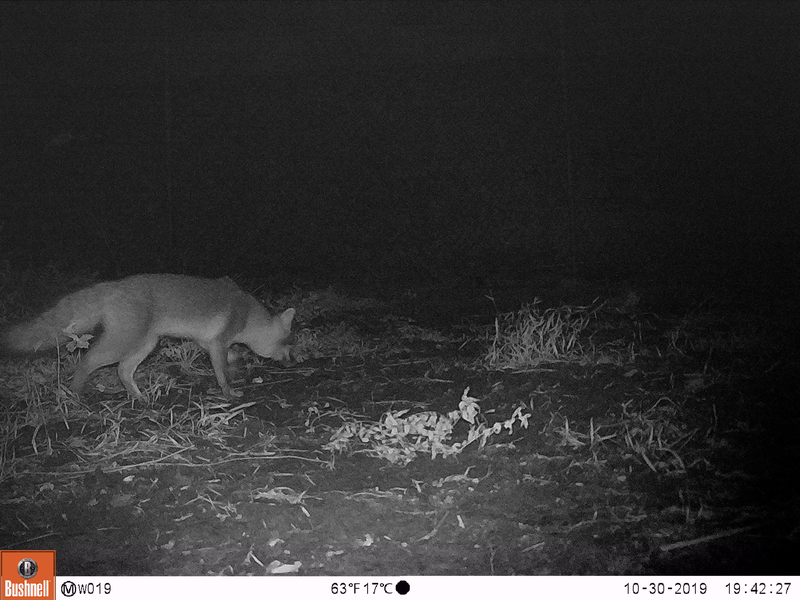

In [ ]:
new_width = 800
new_height = 600
image = image.resize((new_width, new_height), Image.ANTIALIAS)
image


More directory stuff

In [ ]:
import os

In [ ]:
image_files = []

for root, dirs, files in os.walk('.'):
    for file in files:
        if file.lower().endswith('.jpg'):
            image_files.append(os.path.join(root, file))

In [ ]:
len(image_files)

3817

In [ ]:
for image in image_files:
  if "ghost" in image.lower() or "unknown" in image.lower():
    image_files.remove(image)
len(image_files)

2900

In [ ]:
image_files[:10]

['./Julia_OctNovDec_2019/FE1/W016/Ghost/FE1-103119-Ghost (2).JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/ghost.JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/Ghost (3).JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/Ghost (5).JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/ghost (8).JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/ghost (9).JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/ghost (11).JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/ghost (14).JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/Ghost (15).JPG',
 './Julia_OctNovDec_2019/FE1/W016/Ghost/Ghost (17).JPG']

In [ ]:
images_paths = []
for img in image_files:
  images_paths.append(img.lstrip("./"))
images_paths[:10]

['Julia_OctNovDec_2019/FE1/W016/Ghost/FE1-103119-Ghost (2).JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/ghost.JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/Ghost (3).JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/Ghost (5).JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/ghost (8).JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/ghost (9).JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/ghost (11).JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/ghost (14).JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/Ghost (15).JPG',
 'Julia_OctNovDec_2019/FE1/W016/Ghost/Ghost (17).JPG']

In [ ]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn
import torch
from PIL import Image, ImageDraw
import torchvision.transforms as T

count = 0
predictions_data = []
model = fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

for path in images_paths:
  try:
      image = Image.open(path).convert("RGB")
      transform = T.Compose([T.ToTensor()])
      image_tensor = transform(image)

      with torch.no_grad():
          predictions = model([image_tensor])

      predictions_data.append(predictions)

  except Exception as e:
      print(f"An error occurred at indice: {count}")
      images_paths.pop(count)

  count += 1
  if count % 10 == 0:
    print(count)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1110
1120
1130
1140
1150
1160
1170
1180
1190
1200
1210
1220
1230
1240
1250
1260
1270
1280
1290
1300
1310
1320
1330
1340
1350
An error occurred at indice: 1353
An error occurred at indice: 1354
An error occurred at indice: 1355
An error occurred at indice: 1356
An error occurred at indice: 1357
An error occurred at indice: 1358
An error occurred at indice: 1359
1360
An error occurred at indice: 1360
An error occurred at indice: 1361
An error occurred at indice: 1362
An error occurred at indice: 1363
An error occurred at indice: 1364
An error occurred at

In [ ]:
predictions_data_loaded

[[{'boxes': tensor([[2136.2378, 2145.5574, 2421.5740, 2279.1760],
           [2257.4749, 2134.8018, 2420.3506, 2260.8271]]),
   'labels': tensor([16, 16]),
   'scores': tensor([0.4508, 0.2079])}],
 [{'boxes': tensor([[1497.2172, 2065.8394, 1784.3074, 2217.5554]]),
   'labels': tensor([21]),
   'scores': tensor([0.0649])}],
 [{'boxes': tensor([[1489.3542, 2066.0232, 1788.7908, 2225.3354]]),
   'labels': tensor([21]),
   'scores': tensor([0.2097])}],
 [{'boxes': tensor([], size=(0, 4)),
   'labels': tensor([], dtype=torch.int64),
   'scores': tensor([])}],
 [{'boxes': tensor([], size=(0, 4)),
   'labels': tensor([], dtype=torch.int64),
   'scores': tensor([])}],
 [{'boxes': tensor([], size=(0, 4)),
   'labels': tensor([], dtype=torch.int64),
   'scores': tensor([])}],
 [{'boxes': tensor([[1489.2733, 2062.7693, 1791.2015, 2219.4661]]),
   'labels': tensor([21]),
   'scores': tensor([0.0529])}],
 [{'boxes': tensor([], size=(0, 4)),
   'labels': tensor([], dtype=torch.int64),
   'scores': t

## Finding the average max score

In [ ]:
import pickle

# Save to a file
# with open('/content/predictions_data.pkl', 'wb') as file:
#     pickle.dump(predictions_data, file)

# To load it back
with open('/content/predictions_data.pkl', 'rb') as file:
    predictions_data_loaded = pickle.load(file)

In [ ]:
import torch


avg_scores = 0
count = 0

for predictions_dict in predictions_data_loaded:

    scores_tensor = predictions_dict[0]["scores"]


    if scores_tensor.nelement() > 0:
        count += 1
        max_score = torch.max(scores_tensor).item()
        avg_scores += max_score

if count > 0:
    avg_scores = avg_scores / count
else:
    avg_scores = 0

print(avg_scores)


0.5922257844901659


## This is the average max score: 0.5922

In [ ]:
import json
file_path = "predictions_data.txt"

with open(file_path, 'w') as file:
    json.dump([obj.__dict__ for obj in predictions_data], file)

print(f"Objects saved to {file_path}")

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-27-aae00163c47b>", line 4, in <cell line: 4>
    with open(file_path, 'w') as file:
OSError: [Errno 107] Transport endpoint is not connected: 'predictions_data.txt'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'OSError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)
  File "/us